In [ ]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy import ndimage as ndi
from skimage.feature import peak_local_max
from skimage.draw import line
from skimage.morphology import dilation, square, disk
from skimage.segmentation import watershed
from networkx.algorithms.bipartite import hopcroft_karp_matching, to_vertex_cover
import networkx as nx

In [4]:
IMAGE_DIR = "MI01"
MASKS_DIR = f"{IMAGE_DIR}/Masks"
IMAGES_DIR = f"{IMAGE_DIR}/Images"

In [123]:
watershed_video_labels = []
watershed_video_markers = []

images = []
masks = []
for img in os.listdir(MASKS_DIR):
    
    image = cv2.imread(f"{IMAGES_DIR}/I{img[1:]}")
    images.append(image)
    mask_img = cv2.imread(f"{MASKS_DIR}/{img}")
    mask_img = cv2.cvtColor(mask_img, cv2.COLOR_BGR2GRAY)
    ret, thresh = cv2.threshold(mask_img,0,1,cv2.THRESH_BINARY)
    mask = np.array(thresh, dtype=bool)
    masks.append(thresh * 255)
    distance_transform = ndi.distance_transform_edt(mask)
    coords = peak_local_max(distance_transform, min_distance=40)
    watershed_mask = np.zeros(distance_transform.shape, dtype=bool)
    watershed_mask[tuple(coords.T)] = True
    markers, _ = ndi.label(watershed_mask)
    
    watershed_labels = watershed(-distance_transform, markers, mask=mask, watershed_line=False)
    
    watershed_video_labels.append(watershed_labels)
    watershed_video_markers.append(markers)
    # watershed_labels = watershed_labels.squeeze()
    
    # fig, ax = plt.subplots(1, 4, figsize=(20,15))
    # ax[0].imshow(image, cmap='grey')
    # ax[0].set_title("Image")
    # ax[0].axis('off')
    # ax[1].imshow(mask, cmap='grey')
    # ax[1].set_title("Mask")
    # ax[1].axis('off')
    # ax[2].imshow(-distance_transform, cmap=plt.cm.gray)
    # ax[2].set_title("Distance Transform")
    # ax[2].axis('off')
    # ax[3].imshow(watershed_labels, cmap=plt.cm.cubehelix)
    # ax[3].set_title("Watershed")
    # ax[3].axis('off')
    
    plt.show()

In [ ]:
def check_rows(cm, rows, cols):
    leave_out_index = -1
    n_zeroes = 0
    for i in range(len(cm)):
        if rows[i]:
            continue
        row = cm[i, ~cols]
        num_zero = len(np.where(row == 0)[0])
        if num_zero > n_zeroes:
            n_zeroes = num_zero
            leave_out_index = i
    return leave_out_index, n_zeroes

def check_cols(cm, rows, cols):
    leave_out_index = -1
    n_zeroes = 0
    for j in range(len(cm[0])):
        if cols[j]:
            continue
        col = cm[~rows, j]
        num_zero = len(np.where(col == 0)[0])
        if num_zero > n_zeroes:
            n_zeroes = num_zero
            leave_out_index = j
    return leave_out_index, n_zeroes

# convert_cost_matrix takes as input an initial cost matrix (can be square or non-square)
# then subtracts the minimum of each row from each value in that row
# then from the new array, subtracts the minimum of each column for each value in that column
def convert_cost_matrix(cm):
    cm = np.array(cm)
    cm = cm - np.min(cm, axis=1)[:, None]
    # cm = cm - np.min(cm, axis=0)
    return cm

# construct_bipartite_graph takes in a cost matrix and outputs a graph
def construct_bipartite_graph(cm):
    graph = np.zeros((cm.shape[0] + cm.shape[1], cm.shape[0] + cm.shape[1]))
    for i in range(len(cm)):
        for j in range(len(cm[i])):
            if cm[i,j] == 0:
                graph[i,j + cm.shape[0]] = 1
                graph[j + cm.shape[0], i] = 1       
    return graph


# assign values after creating cost matrix cm with zeros
def assign_values(cm, assignments):
    for i in range(len(cm)):
        row = cm[i]
        j = np.where(row == 0)[0][0]
        assignments.append((i+1, j+1))
    return assignments
    
    
# follow the steps of the hungarian algorithm to solve the maximum bipartite matching using the associated cost matrix cm

# Step 1 - Convert the cost matrix by subtracting each row by the minimum of that row, then each column byh the minimum of that column
# Step 2 - Find the minimum horizontal and vertical lines needed to cover all zeros in the converted cost matrix 
    # a) first construct a bipartite graph with one set of edges being each row label, and the other set of edges being each column label
    # b) second use the hopcroft-karp algorithm to find the matching with maximal number of edges
    # c) third convert the maximal matching obtained from hopcroft karp to a vertex cover, which will be the minimum number of vertices required such that each edge contains an endpoint at one of the vertices
        # the above step is important because the vertex cover of this graph represents the row and column labels that are used as lines to cover all of the zeros present in the converted cost matrix
    # if the length of the vertex cover is equal to the rank of the cost matrix, end here, we can then skip to step 4, otherwise continue to step 3
# Step 3 - make a submatrix of the cost matrix
    # a) submatrix consist of rows and columns now found in vertex cover
    # b) subtract the minimum of matrix 2 from all values of 2 matrix 2
    # c) add the minimum of matrix 2 to the points where the rows and columns from the vertex cover intersect
    # d) update the cost matrix values with the new submatrix values (same location as original submatrix)
    # e) go back to step 2 with a newly updated cost matrix
# Step 4 - assign rows to columns

def hungarian_method(cm):

    cm = convert_cost_matrix(cm)
    i = 0
    while True:
        rows = np.zeros(cm.shape[0], dtype=bool)
        cols = np.zeros(cm.shape[1], dtype=bool)

        graph = construct_bipartite_graph(cm)
        G = nx.from_numpy_array(graph)
        for i, node in enumerate(G.nodes):
            if i < cm.shape[0]:
                G.nodes[i]['bipartite'] = 0
            else:
                G.nodes[i]['bipartite'] = 1
            
        u = [n for n in G.nodes if G.nodes[n]['bipartite'] == 0]
        max_matching = hopcroft_karp_matching(G, top_nodes=u)
        vertex_cover = to_vertex_cover(G, max_matching, top_nodes=u)
        i += 1
        for vertex in vertex_cover:
            if vertex < cm.shape[0]:
                rows[vertex] = True
            else:
                cols[vertex - cm.shape[0]] = True
    
        


        leftover = cm[~rows, :][:,~cols]
        # print(leftover)
        
        n_lines = len(vertex_cover)

        
        if n_lines == cm.shape[0] or n_lines == cm.shape[1] or len(leftover) == 0:
            break
        min_leftover = np.min(leftover)
        
        


        # subtract the minimum of the leftover subset from the leftover subset
        # add the minimum of the leftover subset to the line intersection points
        for i in range(len(rows)):
            for j in range(len(cols)):
                if not rows[i]:
                    if not cols[j]:
                        cm[i,j] -= min_leftover
                if rows[i]:
                    if cols[j]:
                        cm[i,j] += min_leftover

    rows = np.zeros(cm.shape[0], dtype=bool)
    cols = np.zeros(cm.shape[1], dtype=bool)
    assignments = assign_values(cm, [])
    
    
    return cm, assignments

In [ ]:
def calculate_distance(x1, y1, x2, y2):
    return np.sqrt((x2 - x1)**2 + (y2 - y1)**2)

# calculate_cost_matrix takes 2 frames, finds all markers in both frames, then constructs distance matrix between each marker in frame 1 and each marker in frame 2
def calculate_cost_matrix(frame1, frame2):
    unique_markers1 = np.unique(frame1)
    unique_markers2 = np.unique(frame2)
    
    cm = np.zeros((len(unique_markers1)-1, len(unique_markers2)-1))
    for i in range(len(cm)):
        for j in range(len(cm[i])):
    
            marker_coords1 = np.where(frame1 == i + 1)
            marker_coords2 = np.where(frame2 == j + 1)
            
            x1, y1 = marker_coords1[0], marker_coords1[1]
            x2, y2 = marker_coords2[0], marker_coords2[1]
            
            cm[i,j] = calculate_distance(x1, y1, x2, y2)
    return cm
        
    
    

In [71]:

frame_assignments = []
for i, markers in enumerate(watershed_video_markers):
    if i == 0:
        continue
    
    print(f"Tracking between frames {i - 1} and {i}")
    
    cm = calculate_cost_matrix(watershed_video_markers[i-1], watershed_video_markers[i])
    print(cm.shape)
    print(cm)
    cm, assignments = hungarian_method(cm)
    for assignment in assignments:
        if assignment[0] == -1 or assignment[1] == -1:
            assignments.remove(assignment)
    
    print(assignments)
    print(cm)
    frame_assignments.append(assignments)
    # break
    

    print()
    

Tracking between frames 0 and 1


/tmp/ipykernel_160303/1838838237.py:22: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  cm[i,j] = calculate_distance(x1, y1, x2, y2)


(10, 10)
[[  14.2126704   879.17290677  438.36970698  672.26854753  377.04111182
   935.59179133  572.43776954  719.50677551  726.42824835 1088.97750206]
 [ 871.72128573    8.06225775  506.09880458  306.55668318  884.32573184
   314.30558379  732.2547371   612.67446495  907.74555906  659.02958962]
 [ 439.05580511  512.72312216    8.24621125  241.42286553  377.3857443
   497.39320462  304.77040539  337.89051481  510.86005912  667.2001199 ]
 [ 659.26625881  319.59505628  231.15795465   10.04987562  583.80304898
   274.88543068  417.99641147  321.17907777  599.65323313  518.70029882]
 [ 401.2443146   896.82551257  392.74546465  600.91263924   14.86606875
   811.71238749  264.3217736   462.0183979   351.52382565  840.76453303]
 [ 935.63240645  314.63153052  502.38829604  268.07648162  814.03316886
     9.89949494  590.52942348  413.1682466   717.46776931  353.03540899]
 [ 575.60837381  733.60616137  308.46231536  421.86490729  266.4301034
   579.9698268     4.47213595  199.88246546  210.58

In [72]:
def find_unique_markers(frame_assignments):
    unique_assignments = set()
    unique_markers = set()
    for assignments in frame_assignments:
        for assignment in assignments:
            unique_assignments.add(assignment)
    for assignment in unique_assignments:
        unique_markers.add(assignment[0])
        unique_markers.add(assignment[1])
    # unique_markers.remove(0)
    return unique_markers

### Generate tracks using marker assignments from hungarian method and computed watershed marker locations

In [73]:
markers = find_unique_markers(frame_assignments)

tracks = {}
frame_found = {}
prev_markers = {}
for marker in markers:
    if marker not in prev_markers.keys():
        prev_markers[marker] = [marker]
        frame_found[marker] = []
    i = 0
    while i != len(frame_assignments):
        assignment_list = frame_assignments[i]
        for assignment in assignment_list:
            # if assignment[0] == 0 or assignment[1] == 0:
            #     assignment_list.remove(assignment)
            if assignment[0] == prev_markers[marker][-1]:
                prev_markers[marker].append(assignment[1])
                frame_found[marker].append(i)
                break
        i += 1
        
    for j in range(0, len(frame_found[marker])-1):
        label1, label2 = prev_markers[marker][j], prev_markers[marker][j+1]
        frame1, frame2 = frame_found[marker][j], frame_found[marker][j+1]
        
        loc1 = np.where(watershed_video_markers[frame1] == label1)
        loc2 = np.where(watershed_video_markers[frame2] == label2)
        if marker == 7:
            print(prev_markers[marker])
            print(frame_found[marker])
            
            print(f"{label1} to {label2}")
            print(f"{frame1} to {frame2}")
            print(loc1)
            print(loc2)
            print()
        loc1 = tuple([x[0] for x in loc1])
        loc2 = tuple([x[0] for x in loc2])
        
        if marker not in tracks.keys():
            tracks[marker] = [loc1]
        
        tracks[marker].append(loc2)
        
        if j == len(prev_markers[marker]) - 1:
            break




[7, 7, 7, 8, 9, 9, 9, 9, 9, 9, 9, 8, 11, 10, 9, 10, 10, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67]
7 to 7
0 to 1
(array([622]), array([549]))
(array([626]), array([547]))

[7, 7, 7, 8, 9, 9, 9, 9, 9, 9, 9, 8, 11, 10, 9, 10, 10, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11, 11]
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 4

In [112]:
cubehelix = mpl.colormaps['cubehelix'].resampled(len(tracks))

### GENERATE TRACK IMAGES AND PLOT USING MATPLOTLIB

0


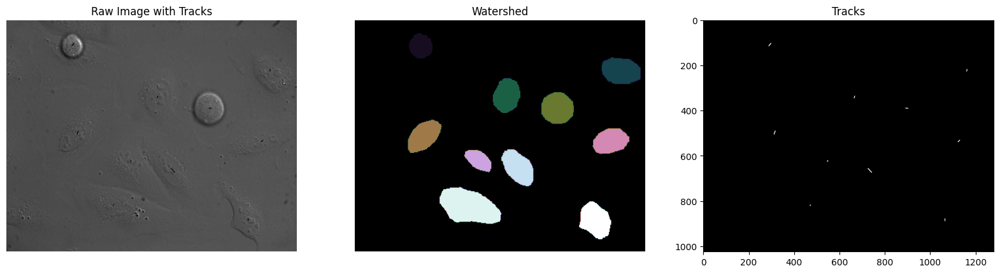

1


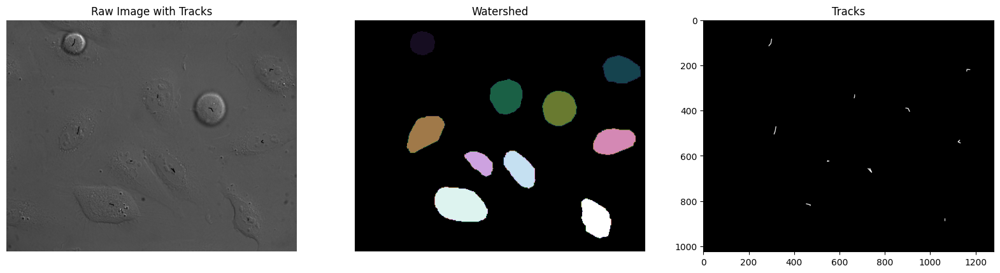

2


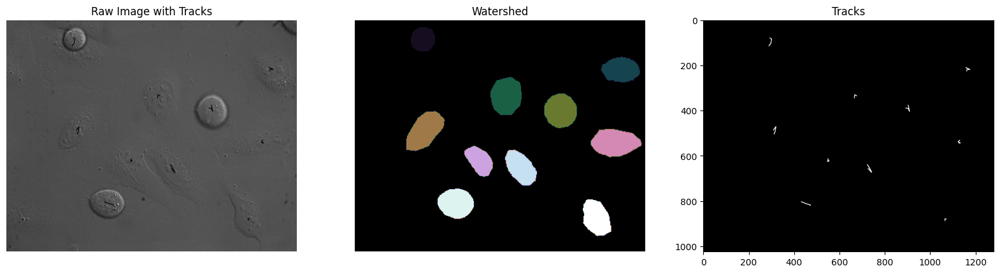

3


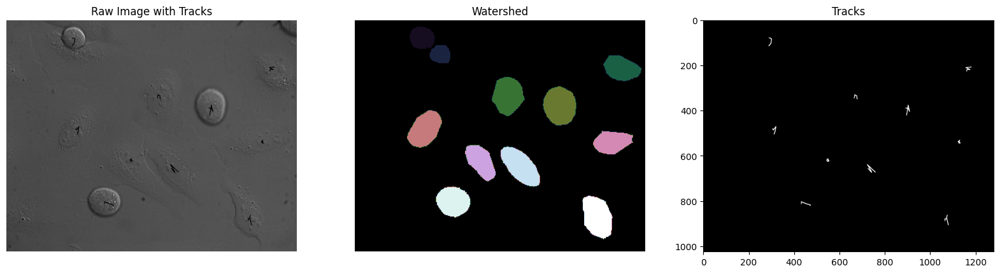

4


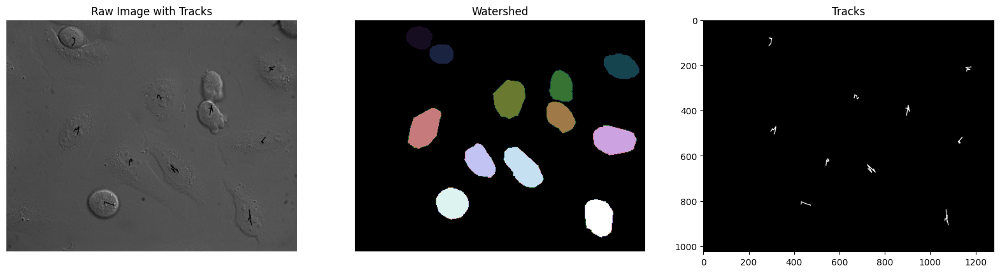

5


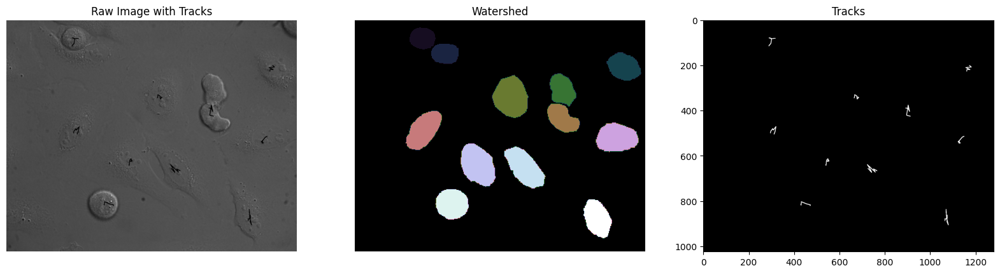

6


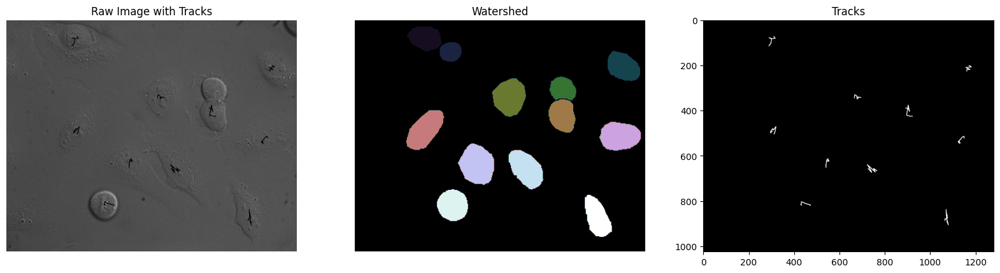

7


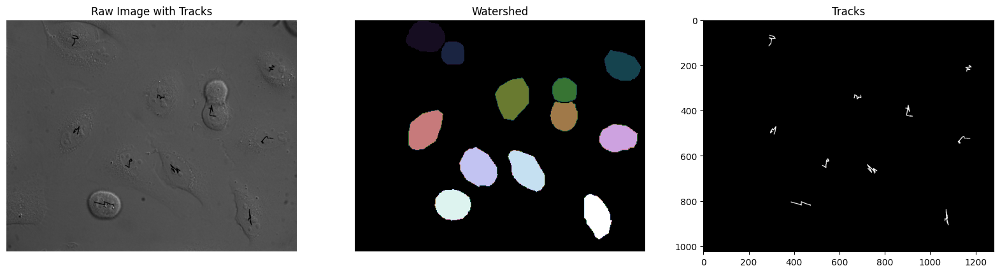

8


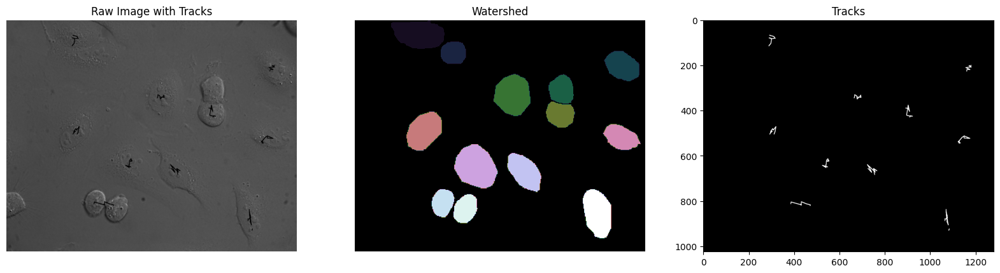

9


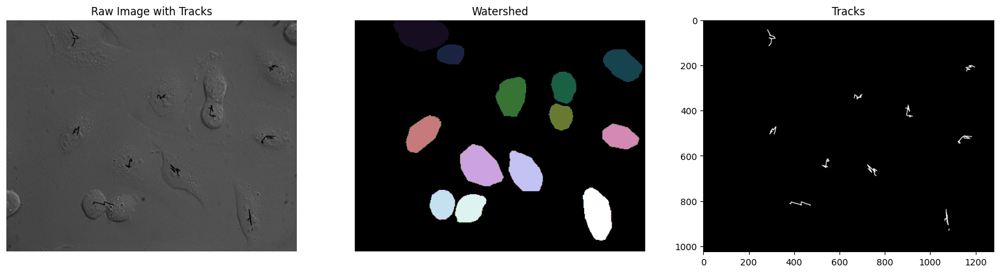

10


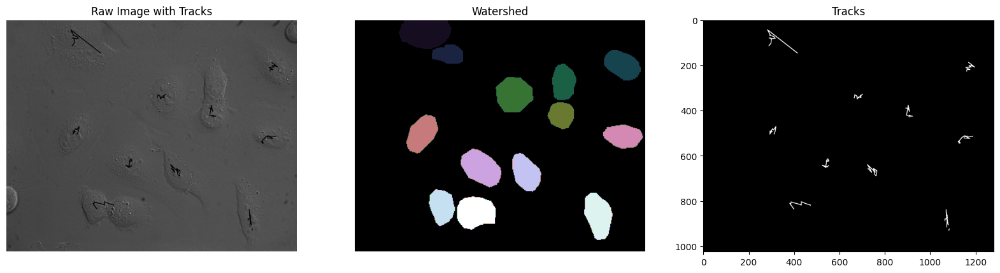

11


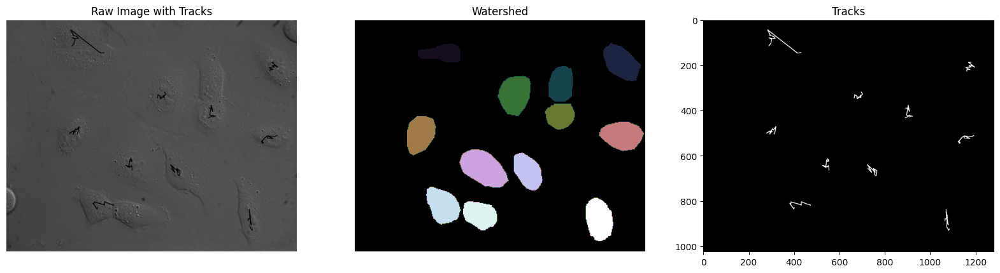

12


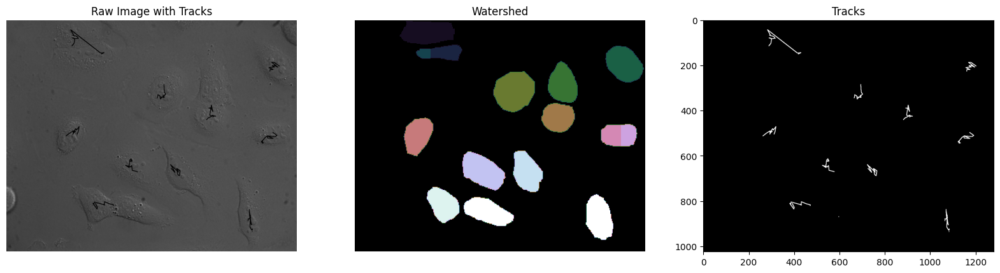

13


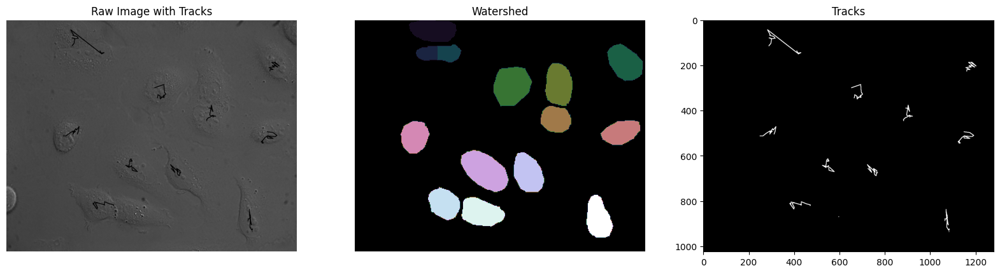

14


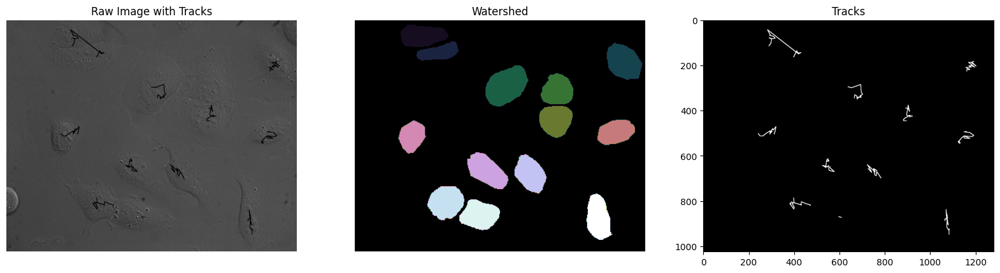

15


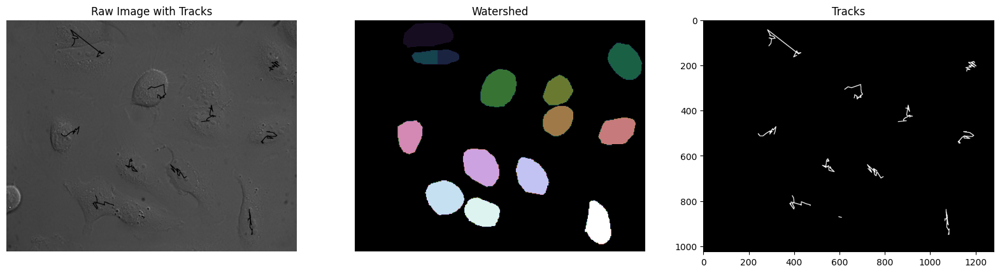

16


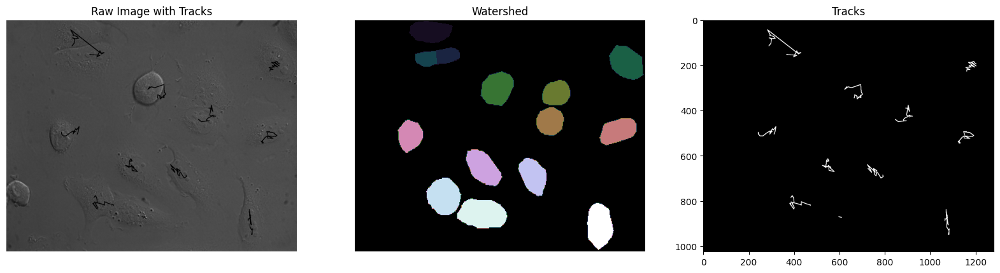

17


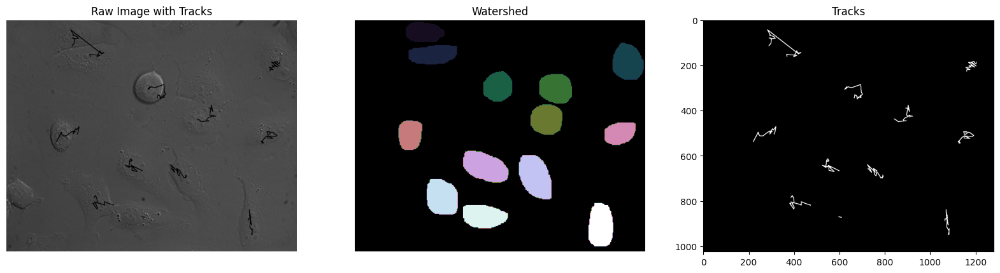

18


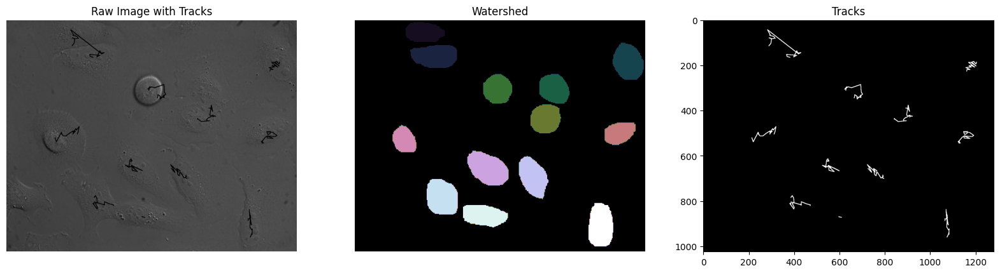

19


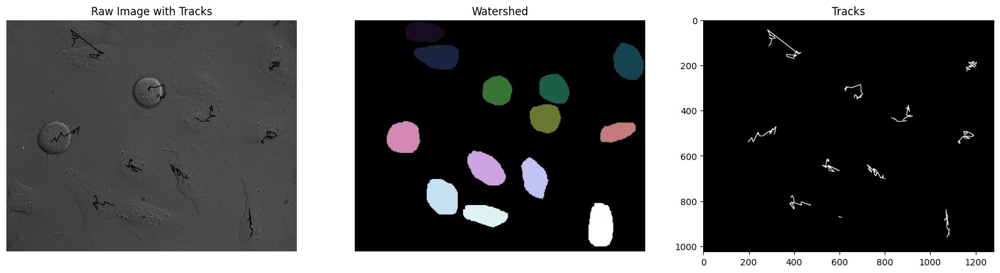

20


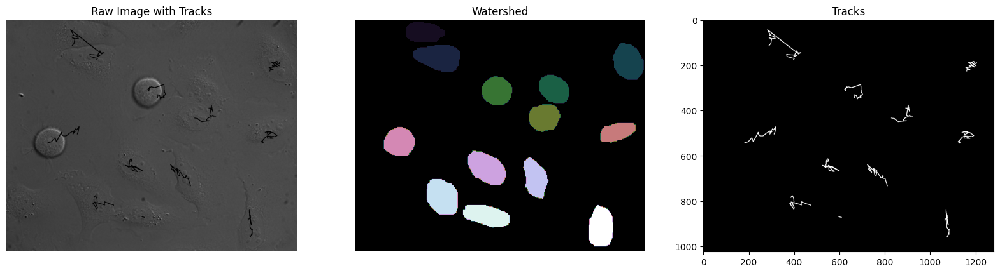

21


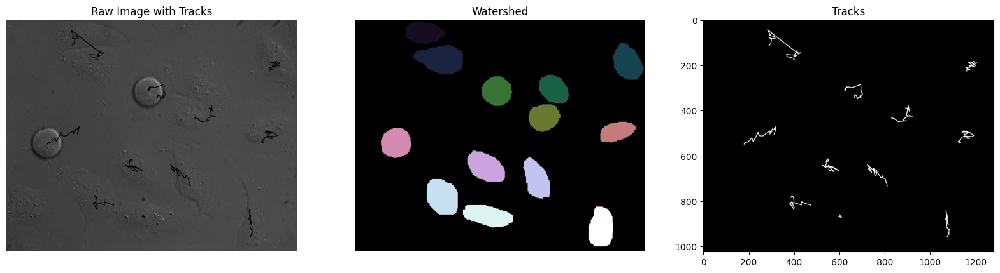

22


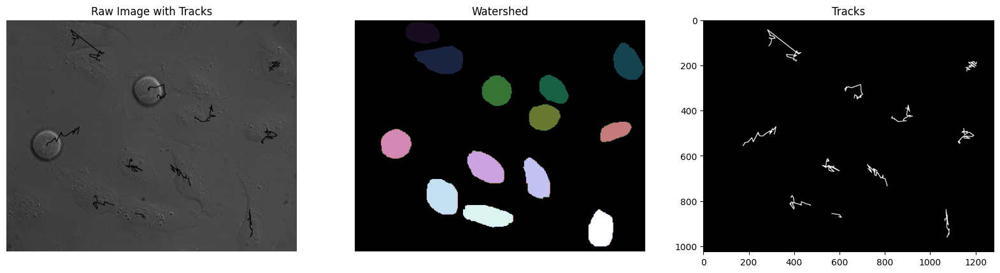

23


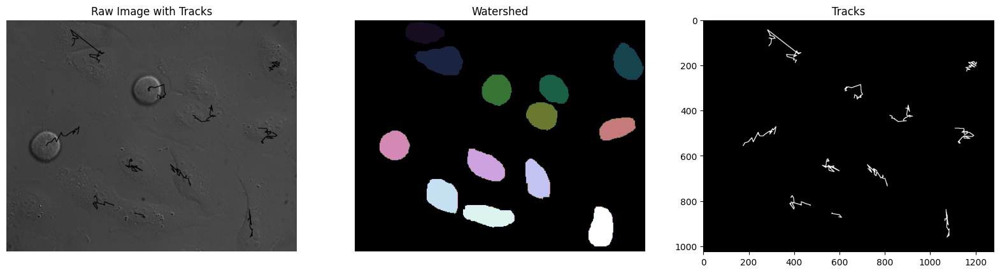

24


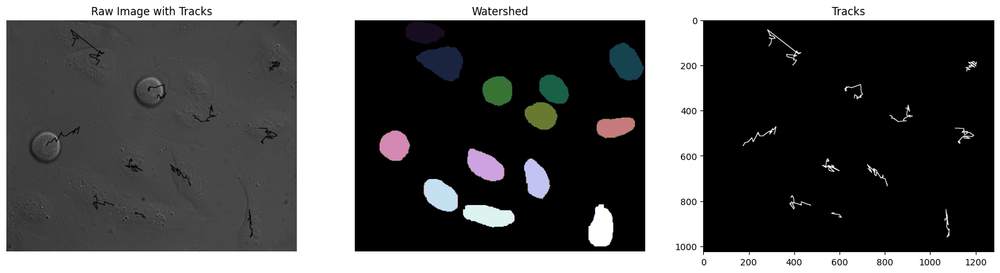

25


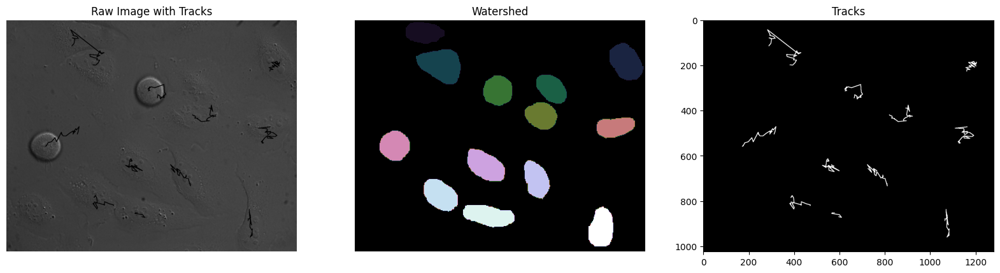

26


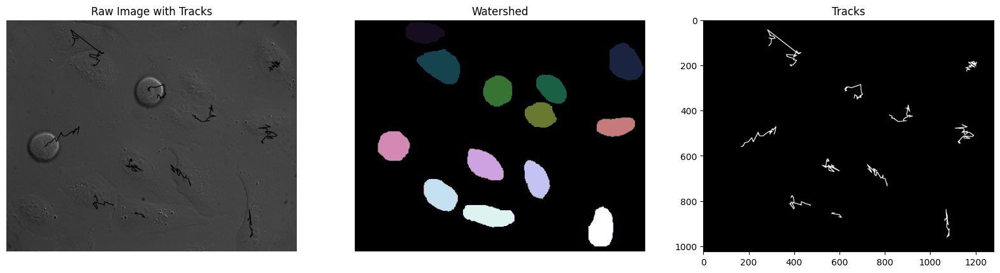

27


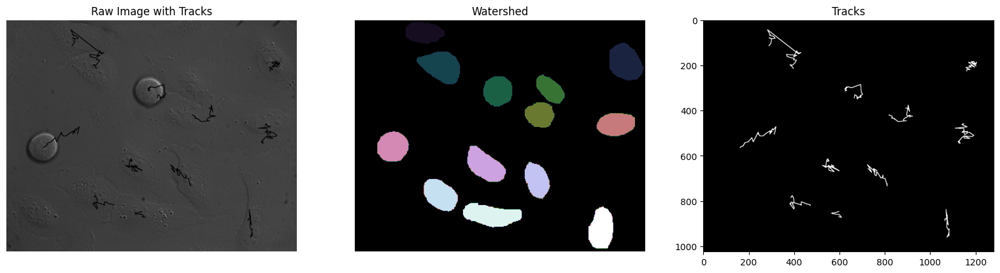

28


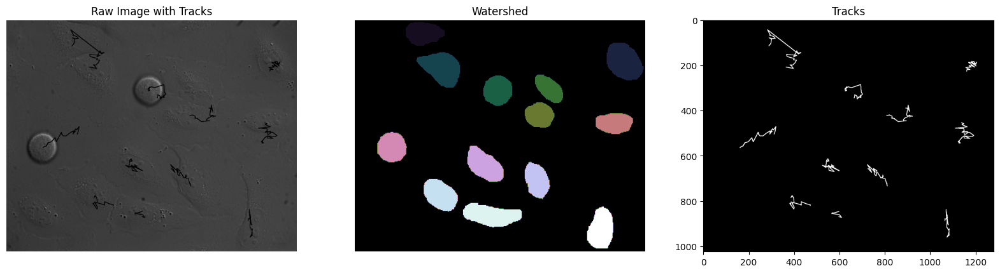

29


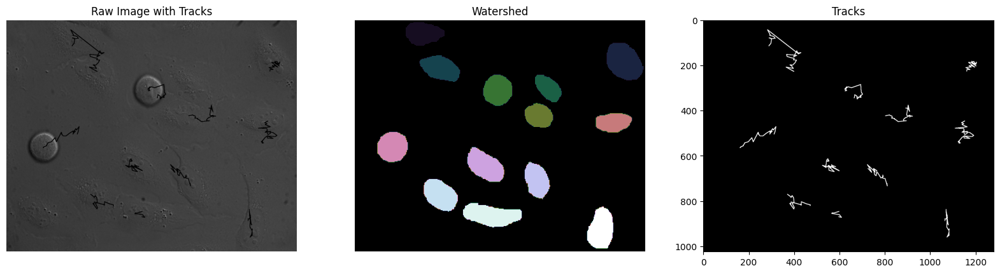

30


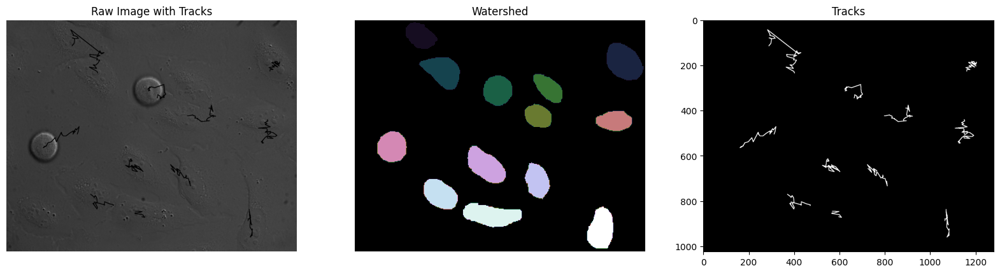

31


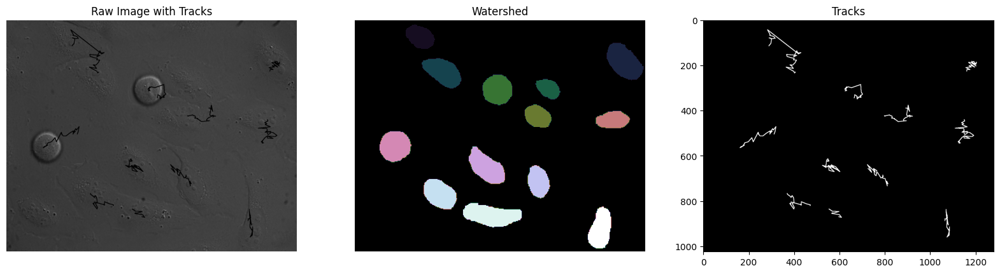

32


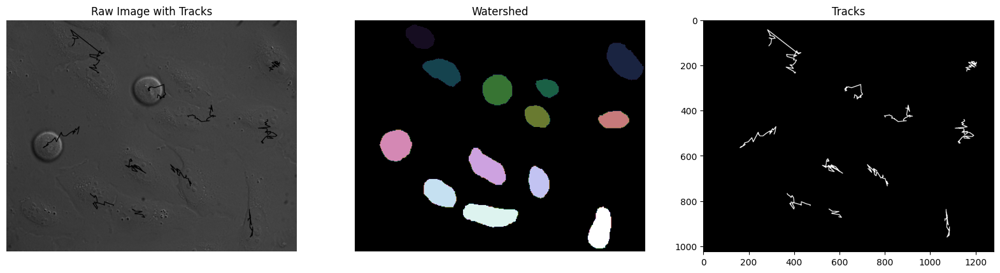

33


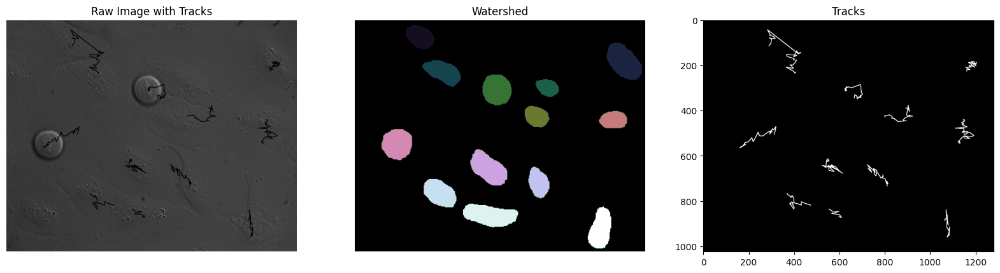

34


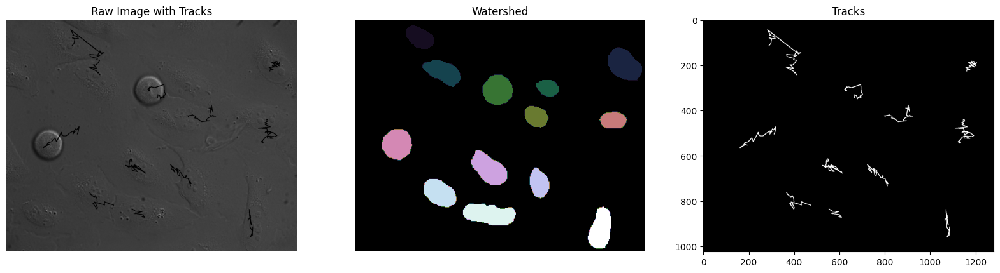

35


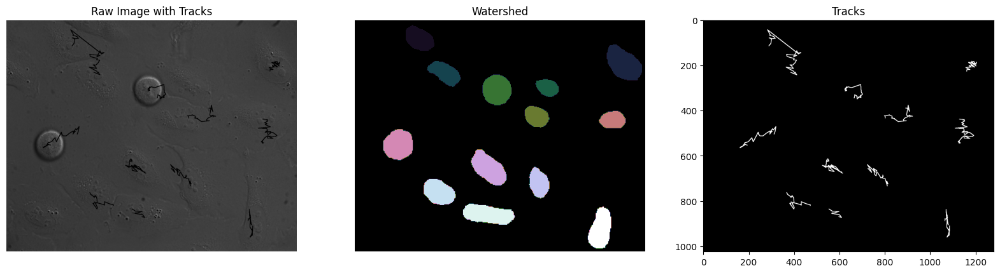

36


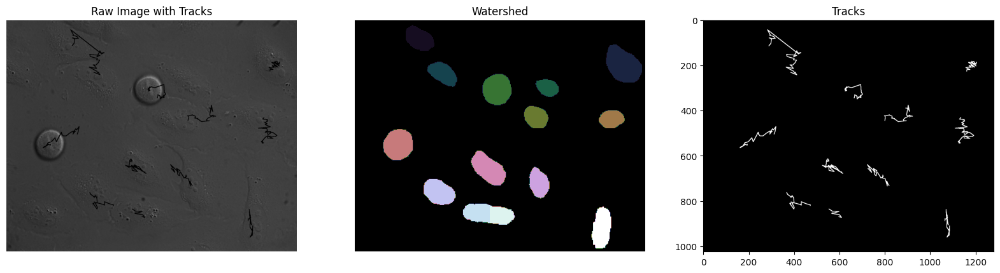

37


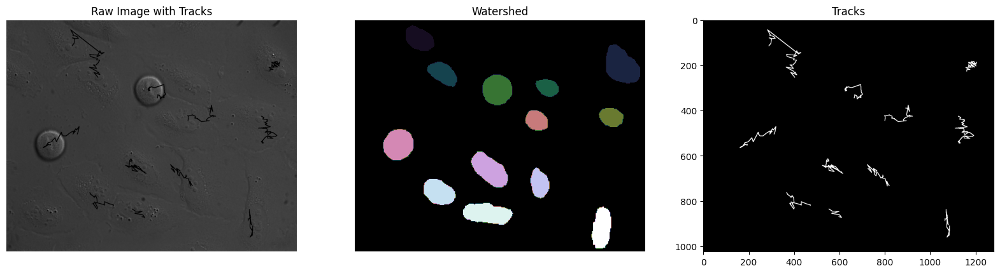

38


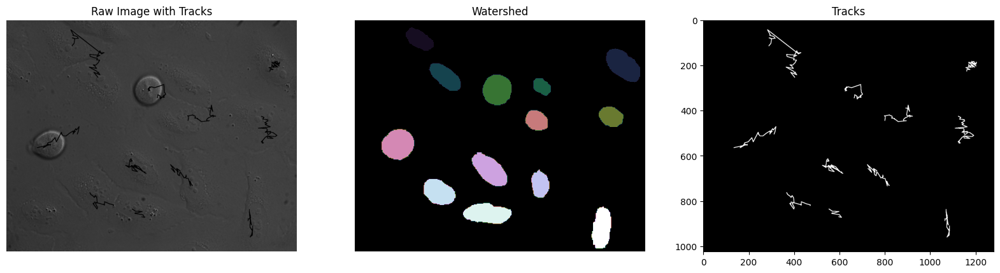

39


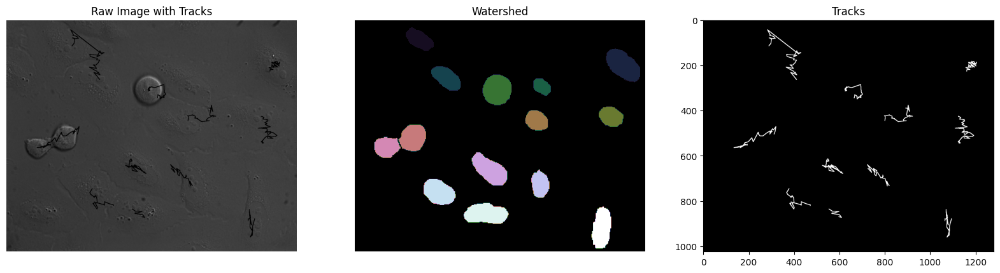

40


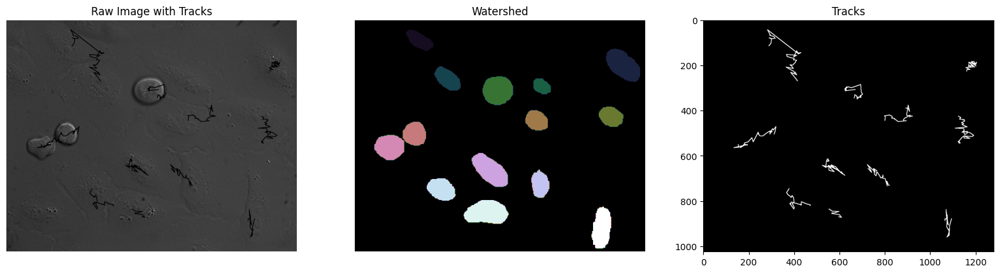

41


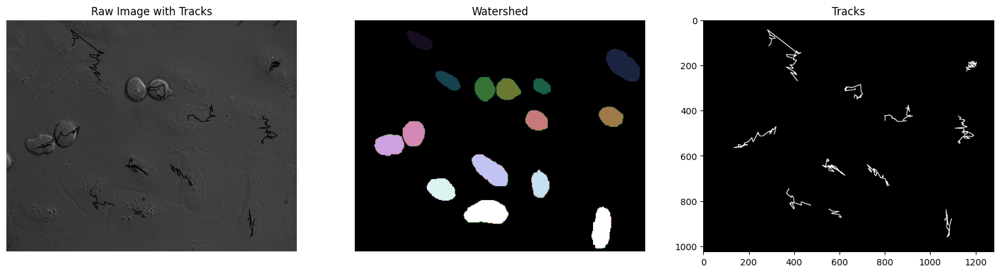

42


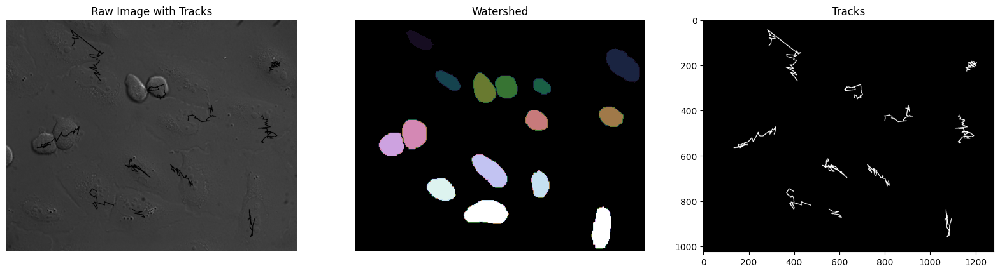

43


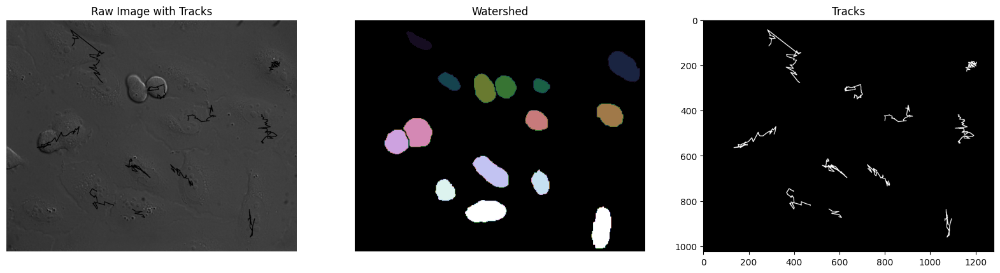

44


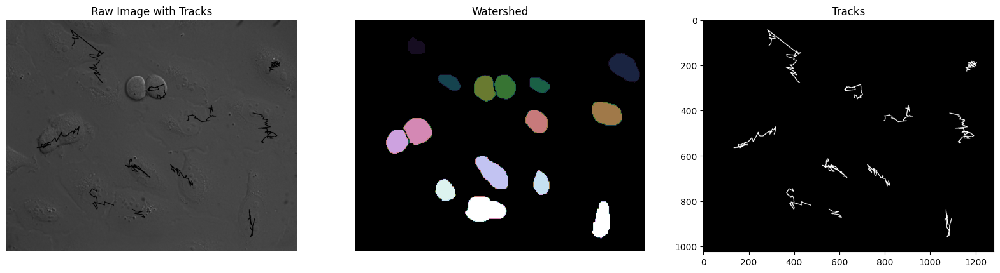

45


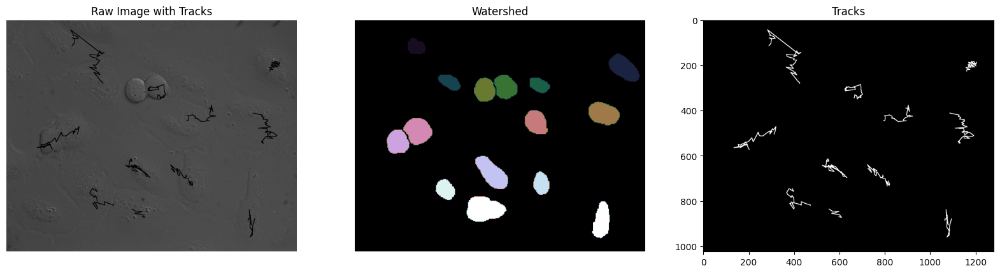

46


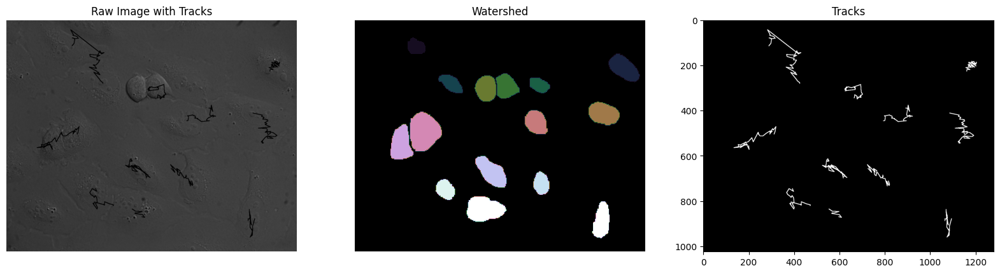

47


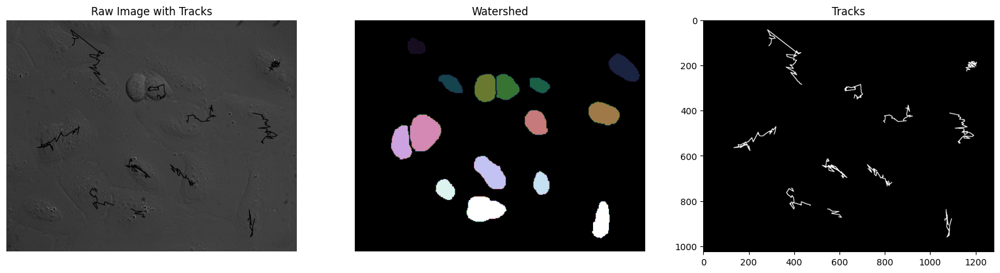

48


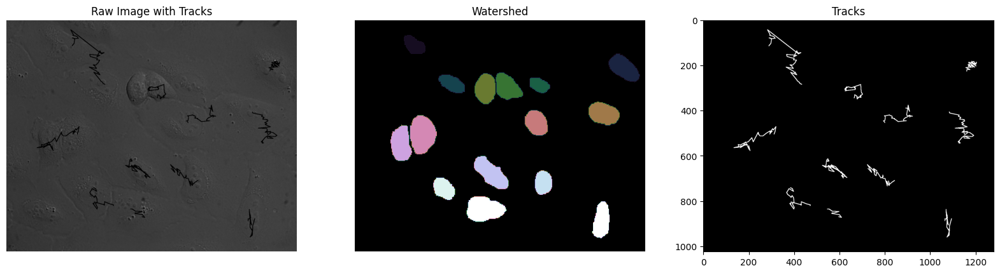

49


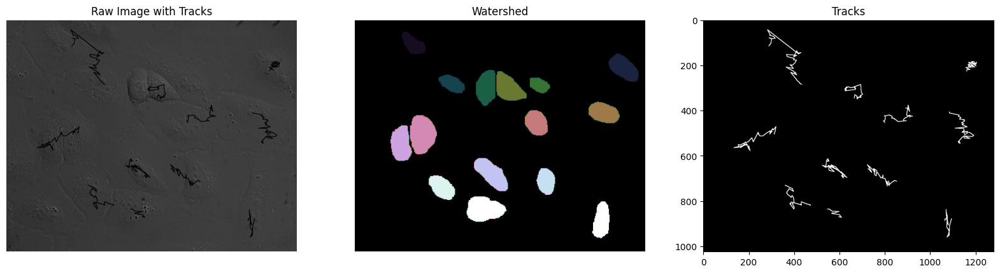

50


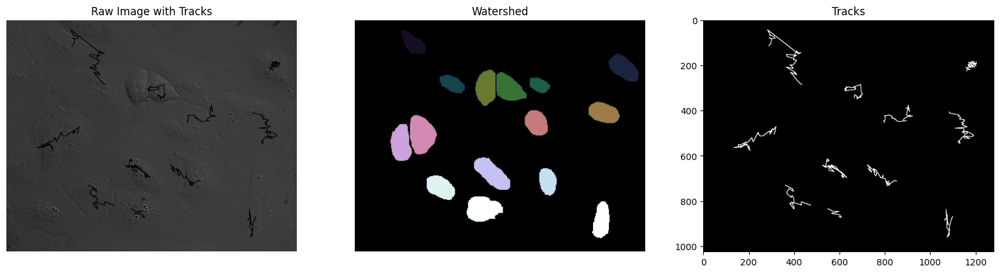

51


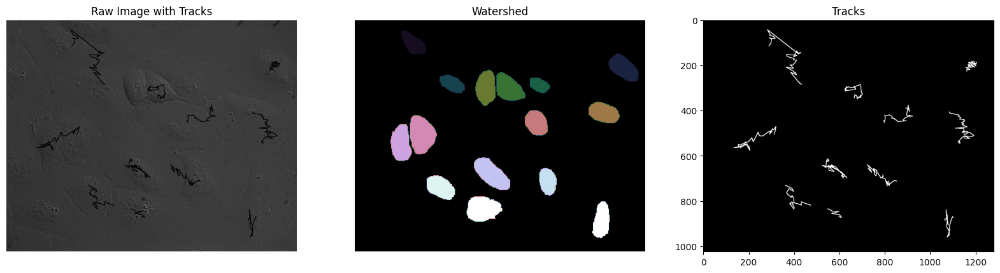

52


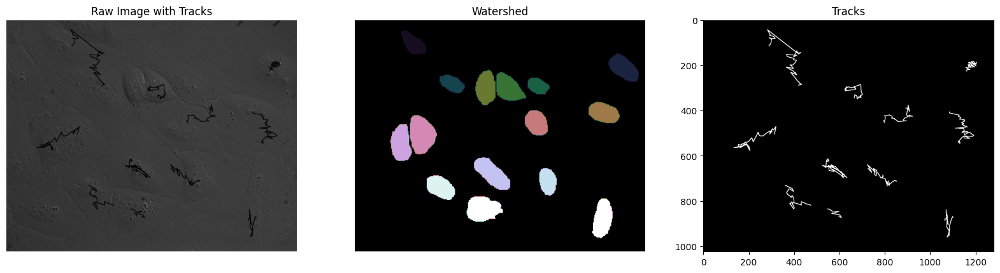

53


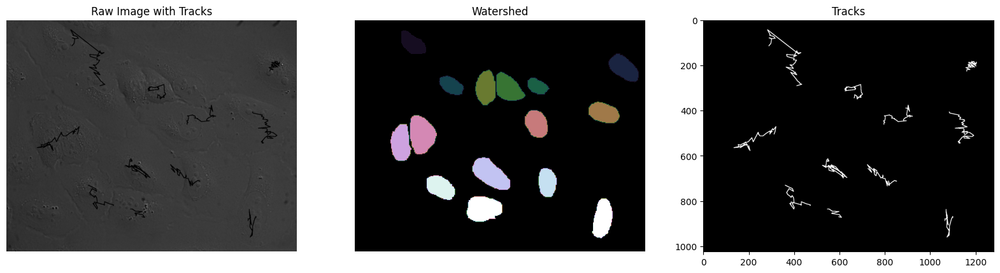

54


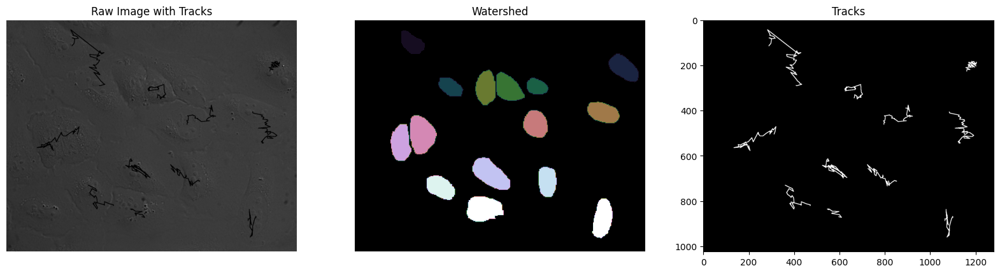

55


IndexError: list index out of range

In [126]:
track_images = []
track_image = np.zeros(images[0].shape)
height = track_image.shape[0]
width = track_image.shape[1]
for i in range(len(images)-1):
    print(i)
    raw_image = np.copy(images[i])
    for track_id, track in tracks.items():
        if i in frame_found[track_id]:
            rgba = cubehelix(track_id)
            thickness = 5
            # track_image = cv2.circle(track_image, track[i], 63, rgba, -1)
            rr, cc  = line(track[i][0], track[i][1], track[i+1][0], track[i+1][1])
            # track_image = cv2.line(track_image,  track[i], track[i+1], rgba, thickness)
            track_image[rr, cc] = 1
            # track_image = cv2.dilate(track_image, np.ones((1,1), np.uint8))
        
    dilated_image = cv2.dilate(track_image, np.ones((3,3), np.uint8))
    raw_image[np.where(dilated_image != 0)] = dilated_image[np.where(dilated_image != 0)]
    
    # watershed = cv2.imread(watershed_video_labels[i], cv2.COLOR_GRAY2BGR)
    
    cv2.imwrite(f"raw_image_tracks/raw_image_track{i}.png", raw_image)
    # cv2.imwrite(f"watershed/watershed{i}.png", watershed)
    cv2.imwrite(f"masks/mask{i}.png", masks[i])
    cv2.imwrite(f"tracks/track{i}.png", dilated_image)
    
    
    fig, ax = plt.subplots(1, 3, figsize=(20,15))
    ax[0].imshow(raw_image, cmap=cubehelix)
    ax[0].set_title("Raw Image with Tracks")
    ax[0].axis('off')
    ax[1].imshow(watershed_video_labels[i], cmap=cubehelix)
    ax[1].set_title("Watershed")
    ax[1].axis('off')
    ax[2].imshow(dilated_image, cmap=cubehelix)
    ax[2].set_title("Tracks")
    
    # ax[2].axis('off')
    plt.show()
    